In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import open3d as o3d
from glob import glob
import cv2
from scipy.optimize import minimize

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [97]:
img_paths=sorted(glob("./test_stationary/*.png"))

In [89]:
img_paths=sorted(glob("./Oculus_reader/*/polar/*.png"))

In [18]:
def k_means(roi,t=15,s=12,K=3):

    Z = roi.reshape((-1, 1)).astype(np.float32)
    H,W=roi.shape
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    ret, label, center = cv2.kmeans(Z, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    center = np.uint8(center)
    sorted_idx = np.argsort(center.flatten())
    elevation_angles = np.linspace(t, t+s/2, K)  # Descending order

    # Create Elevation Map
    elevation_map = np.zeros_like(label, dtype=float)
    for i, idx in enumerate(sorted_idx):
        elevation_map[label.flatten() == idx] = elevation_angles[i]
        
    elevation_map = elevation_map.reshape((H, W))
    elevation_map=cv2.GaussianBlur(elevation_map,(35,35),0)
    # Apply Jet Colormap
    #norm_elevation_map = (elevation_map - elevation_map.min()) / (elevation_map.max() - elevation_map.min())
    #jet_colormap = plt.cm.jet(norm_elevation_map)[:, :, :3]  # Remove alpha channel
    norm_elevation_map = (roi - roi.min()) / (roi.max() - roi.min()+1e-6)
    jet_colormap = plt.cm.jet(norm_elevation_map)[:, :, :3]  # Remove alpha channel
    return elevation_map,jet_colormap
# Generate Point Cloud



In [19]:
points=[]
colors=[]

In [20]:
def point_cloud(roi,elevation_map,range_min=0,range_max=0,offset_x=0,offset_y=0,offset_z=0,H_fls=1.4,FOV=40,R_max=5):    

    H,W=roi.shape
    if(range_max==0):
        range_max=W
    # Run Optimization
    heights=[]
    for y in range(range_min,range_max):
        r = (y/H)*R_max  # Direct range from x index
        
        for x in range(W):
            
            theta=(x/W)*FOV-FOV/2
            #print(theta)
            #initial_guess = [0.0, elevation_map[y, x]]  # Initial h_obj and theta
            #result = minimize(cost_function, initial_guess, args=(r), method='Powell',options={'maxiter': 10})
            #optimized_map[y, x] = result.x[1]
            if(elevation_map[y,x]!=0):
                height=H_fls-r * np.cos(np.radians(elevation_map[y, x]))
            
                print(height)
            #height=H_fls-r * np.sin(np.radians(21))
                heights.append(height)
                if(height<0):
                    height=0
                
                intensity = roi[y, x] / 255.0
                #print("color: ",intensity)
                if(intensity>0.5):
                    points.append([offset_x+r*np.cos(np.deg2rad(theta)),r*np.sin(np.deg2rad(theta)),height])
                    if(height>0):
                        colors.append(plt.cm.jet(intensity)[:3])
                    else:
                        colors.append([0,0,0.5])
    print(np.max(heights))

In [21]:
offsets_x=np.linspace(0,0.01,len(img_paths))

Pseudocode:

1) Start  
2) Read images one by one till done
3) Cluster based on intensities and assign elevation angles
4) Generate point cloud
5) Offset point cloud based on localization data
6) Repeat till done

In [22]:
i=0
for img_path in img_paths[:10]:
    print(i)
    img=cv2.imread(img_path,0)
    elevation_map,jet_colormap=k_means(img)
    point_cloud(img,elevation_map,120,300,offset_x=offsets_x[i])
    i+=1

0
0.07313329396693802
0.07313728908824069
0.07315020876975886
0.07316814112964809
0.07318913052647136
0.07321186303083671
0.07323417518572772
0.07325468776876587
0.07326976272907437
0.07328134676904696
0.07328712283695427
0.0732872483526632
0.07328048720862745
0.0732664855286822
0.0732438414723946
0.07321531441953089
0.07317401225782061
0.07312211281839565
0.07305885289686498
0.07298793212636556
0.0729073726325602
0.07282087448465036
0.07273158259706802
0.07264457994409779
0.07256257442735214
0.07248830102415749
0.07242196702398962
0.0723686631710192
0.07232778410303498
0.07229865561252047
0.07228024631218677
0.07227133723986756
0.07227107858478932
0.07227864169109188
0.07229134312581453
0.07230653769880813
0.07232294315528143
0.07233841510427652
0.07235213793876705
0.07236067147119973
0.07236148052435243
0.07235341662014139
0.07233668648257452
0.07231272568238012
0.0722826477584173
0.0722495665030305
0.07221625144969779
0.07218590701122252
0.0721610621908495
0.07214639647395216
0.0721

In [23]:
points

[[1.4243917679595344, 0.0505187040610651, 0.04397330727452364],
 [1.4242487031756037, 0.054402937361026665, 0.04402667175551245],
 [1.4240950463336604, 0.05828676606938331, 0.04408949620561131],
 [1.4239307985764411, 0.06217016130231798, 0.04417250750324886],
 [1.4235705352809354, 0.0699355358229866, 0.04446137139293738],
 [1.4233745224219072, 0.0738174573600642, 0.04470079180411224],
 [1.4231679240060993, 0.0776988299208366, 0.04502133540954789],
 [1.4229507415699723, 0.08157962463975299, 0.045429045651361966],
 [1.4358787983463046, 0.05092611296478337, 0.035375617684217486],
 [1.4357345798141166, 0.05484167072684139, 0.03541609914196453],
 [1.435579683804093, 0.05875682063445898, 0.035463089781887724],
 [1.4354141114681864, 0.06267153357088505, 0.035527697755905585],
 [1.4348533492156321, 0.07441275943554858, 0.03598907146899655],
 [1.4346450846835677, 0.07832543338794011, 0.03628683635370078],
 [1.4282418652619535, 0.15641792363788012, 0.0417660553921777],
 [1.427809991198111, 0.160

In [24]:
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(np.array(points))
pcd.colors = o3d.utility.Vector3dVector(np.array(colors))
o3d.visualization.draw_geometries([pcd])

In [9]:
points

[[2.700266151683645, -0.9828165038093928, 0],
 [2.7029363237370583, -0.9754490247631162, 0],
 [2.7055863942040825, -0.9680742913569541, 0],
 [2.708216343376291, -0.9606923584363868, 0],
 [2.7108261516948997, -0.9533032809004369, 0],
 [2.7134157997509094, -0.9459071137012611, 0],
 [2.715985268285252, -0.9385039118437417, 0],
 [2.718534538188934, -0.9310937303850769, 0],
 [2.721063590503177, -0.9236766244343724, 0],
 [2.7235724064195606, -0.9162526491522303, 0],
 [2.7260609672801617, -0.9088218597503401, 0],
 [2.7285292545776914, -0.9013843114910676, 0],
 [2.730977249955635, -0.8939400596870429, 0],
 [2.7334049352083887, -0.8864891597007512, 0],
 [2.7358122922813912, -0.879031666944119, 0],
 [2.7381993032712644, -0.8715676368781035, 0],
 [2.7405659504259394, -0.864097125012279, 0],
 [2.7429122161447945, -0.8566201869044247, 0],
 [2.7452380829787817, -0.8491368781601116, 0],
 [2.747543533630561, -0.8416472544322887, 0],
 [2.7498285509546228, -0.8341513714208687, 0],
 [2.7520931179574224, 

In [25]:

import math

from scipy.optimize import root

def soca(img, train_hs, guard_hs, tau):
  print(train_hs)
  """
  Implements Sum-Oriented Constant Amplitude filter based on NumPy.

  Args:
    img: Input image as a NumPy array (assumed to be BGR or grayscale).
    train_hs: Training window half-size.
    guard_hs: Guard window half-size.
    tau: Threshold parameter.

  Returns:
    A 2D NumPy array with filtered binary image.
  """

  # Convert OpenCV image to NumPy array and grayscale (if necessary)
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if img.ndim == 3 else img
  blurred_image = cv2.GaussianBlur(img_gray, (7, 7), 0)
  denoised_image = cv2.fastNlMeansDenoising(blurred_image, h=200)


  rows, cols = denoised_image.shape
  ret = np.zeros((rows, cols), dtype=np.uint8)

  for col in range(cols):
    for row in range(train_hs + guard_hs, rows - train_hs - guard_hs):
      leading_sum, lagging_sum = 0.0, 0.0
      for i in range(row - train_hs - guard_hs, row + train_hs + guard_hs + 1):
        if (i - row) > guard_hs:
          lagging_sum += denoised_image[i, col]
        else:
          leading_sum += denoised_image[i, col]
      sum_train = np.min([leading_sum, lagging_sum])
      ret[row, col] = (tau * sum_train / train_hs)

  return ret

def goca(img, train_hs, guard_hs, tau):
  """
  Implements Sum-Oriented Constant Amplitude filter based on NumPy.

  Args:
    img: Input image as a NumPy array (assumed to be BGR or grayscale).
    train_hs: Training window half-size.
    guard_hs: Guard window half-size.
    tau: Threshold parameter.

  Returns:
    A 2D NumPy array with filtered binary image.
  """

  # Convert OpenCV image to NumPy array and grayscale (if necessary)
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if img.ndim == 3 else img
  blurred_image = cv2.GaussianBlur(img_gray, (7, 7), 0)
  denoised_image = cv2.fastNlMeansDenoising(blurred_image, h=200)

  rows, cols = denoised_image.shape
  ret = np.zeros((rows, cols), dtype=np.uint8)

  for col in range(cols):
    for row in range(train_hs + guard_hs, rows - train_hs - guard_hs):
      leading_sum, lagging_sum = 0.0, 0.0
      for i in range(row - train_hs - guard_hs, row + train_hs + guard_hs + 1):
        if (i - row) > guard_hs:
          lagging_sum += denoised_image[i, col]
        else:
          leading_sum += denoised_image[i, col]
      sum_train = np.max([leading_sum, lagging_sum])
      ret[row, col] = ((tau * sum_train / train_hs))

  return ret
class CFAR(object):
      """
      Constant False Alarm Rate (CFAR) detection with several variants
          - Cell averaging (CA) CFAR
          - Greatest-of cell-averaging (GOCA) CFAR
          - Order statistic (OS) CFAR
      """

      def __init__(self, Ntc, Ngc, Pfa, rank=None):
          self.Ntc = Ntc #number of training cells
          assert self.Ntc % 2 == 0
          self.Ngc = Ngc #number of guard cells
          assert self.Ngc % 2 == 0
          self.Pfa = Pfa #false alarm rate
          if rank is None: #matrix rank
              self.rank = self.Ntc / 2
          else:
              self.rank = rank
              assert 0 <= self.rank < self.Ntc

          #threshold factor calculation for the 4 variants of CFAR
          self.threshold_factor_SOCA = self.calc_WGN_threshold_factor_SOCA()
          self.threshold_factor_GOCA = self.calc_WGN_threshold_factor_GOCA()


          self.params = {
              
              "SOCA": (self.Ntc // 2, self.Ngc // 2, self.threshold_factor_SOCA),
              "GOCA": (self.Ntc // 2, self.Ngc // 2, self.threshold_factor_GOCA),

          }
          self.detector = {
              
              "SOCA": soca,
              "GOCA": goca,
          
          }
        

      def __str__(self):
          return "".join(
              [
                  "CFAR Detector Information\n",
                  "=========================\n",
                  "Number of training cells: {}\n".format(self.Ntc),
                  "Number of guard cells: {}\n".format(self.Ngc),
                  "Probability of false alarm: {}\n".format(self.Pfa),
                  "Order statictics rank: {}\n".format(self.rank),
                  "Threshold factors:\n",
                
                  "    SOCA-CFAR: {:.3f}\n".format(self.threshold_factor_SOCA),
                  "    GOCA-CFAR: {:.3f}\n".format(self.threshold_factor_GOCA),
          
              ]
          )

      def calc_WGN_threshold_factor_CA(self):
          return self.Ntc * (self.Pfa ** (-1.0 / self.Ntc) - 1)

      def calc_WGN_threshold_factor_SOCA(self):
          x0 = self.calc_WGN_threshold_factor_CA()
          for ratio in np.logspace(-2, 2, 10):
              ret = root(self.calc_WGN_pfa_SOCA, x0 * ratio)
              if ret.success:
                  return ret.x[0]
          raise ValueError("Threshold factor of SOCA not found")

      def calc_WGN_threshold_factor_GOCA(self):
          x0 = self.calc_WGN_threshold_factor_CA()
          for ratio in np.logspace(-2, 2, 10):
              ret = root(self.calc_WGN_pfa_GOCA, x0 * ratio)
              if ret.success:
                  return ret.x[0]
          raise ValueError("Threshold factor of GOCA not found")

      def calc_WGN_pfa_GOSOCA_core(self, x):
          x = float(x)
          temp = 0.0
          for k in range(int(self.Ntc / 2)):
              l1 = math.lgamma(self.Ntc / 2 + k)
              l2 = math.lgamma(k + 1)
              l3 = math.lgamma(self.Ntc / 2)
              temp += math.exp(l1 - l2 - l3) * (2 + x / (self.Ntc / 2)) ** (-k)
          return temp * (2 + x / (self.Ntc / 2)) ** (-self.Ntc / 2)

      def calc_WGN_pfa_SOCA(self, x):
          return self.calc_WGN_pfa_GOSOCA_core(x) - self.Pfa / 2

      def calc_WGN_pfa_GOCA(self, x):
          x = float(x)
          temp = (1.0 + x / (self.Ntc / 2)) ** (-self.Ntc / 2)
          return temp - self.calc_WGN_pfa_GOSOCA_core(x) - self.Pfa / 2


      def detect(self, mat, alg="CA"):
          """
          Return target mask array.
          """
          #pad_width = [(self.Ntc//2 + self.Ngc//2, self.Ntc//2 + self.Ngc//2), (self.Ntc//2 + self.Ngc//2, self.Ntc//2 + self.Ngc//2)]
          #mat=np.pad(mat, pad_width=pad_width, mode='constant', constant_values=0)
          return self.detector[alg](mat, *self.params[alg])

def soca_code(soca_trial):

  # img_gray=cv2.imread("test.png",0)
  img = soca_trial
  cfar_obj=CFAR(4,2,0.95) 

  cfar_result=cfar_obj.detect(img,alg="SOCA")
  return cfar_result 

In [98]:
points=[]
colors=[]
i=0
for img_path in img_paths[:30]:
    print(i)
    img=cv2.imread(img_path,0)[:,100:200]
    #elevation_map,jet_colormap=k_means(img)
    filter=soca_code(img)
    test_cluster=filter==6
    #elevation_map=test_cluster*
    test_cluster=img*test_cluster
    elevation_map,jet_colormap=k_means(test_cluster*255)
    
    point_cloud(test_cluster*255,elevation_map,120,150,offset_x=offsets_x[i])
    i+=1

0
2


/tmp/ipykernel_32163/1091439947.py:152: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x = float(x)
/tmp/ipykernel_32163/1091439947.py:165: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x = float(x)


0.06923997836246998
0.06924546354732208
0.06926124431711878
0.06928650285833826
0.06932065707643442
0.06936287984674339
0.06941157761412842
0.06946628157275692
0.0695262380546886
0.06959071921544613
0.06965873278272583
0.06972934616774529
0.06980149435787197
0.06987246995700969
0.06994084627937913
0.07000325085082548
0.07005721479764415
0.07009970265316601
0.07012885730760465
0.07014345340225292
0.07014396652107258
0.07013152834437819
0.07010811244568949
0.07007658387775217
0.07004111348339137
0.07000491916857543
0.06997245392478102
0.06994589958697084
0.06992825157532123
0.0699206346392578
0.06992455154854182
0.06994013514103159
0.06997064453176272
0.0700168523621787
0.07008065696872401
0.07016788732240031
0.07028210882271835
0.07042938690358791
0.07061643114100358
0.0708481258852689
0.071133589471291
0.07147751139377956
0.07188331726532504
0.07235313138552746
0.07288731504953128
0.07348537371302899
0.07413860667777716
0.0748379537074535
0.07557175438872021
0.0763262558534672
0.077087

In [99]:
elevation_map.shape

(435, 100)

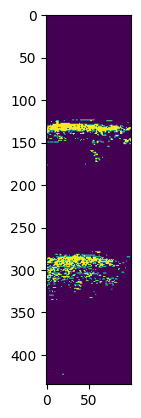

In [100]:
plt.imshow((img[:])>80)

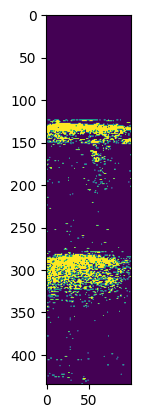

In [101]:
plt.imshow(cv2.equalizeHist(img[:])>230)

In [102]:
np.unique(elevation_map)

array([15.        , 15.00000152, 15.00000304, ..., 19.90120029,
       19.90212338, 19.90345862])

In [103]:
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(np.array(points))
pcd.colors = o3d.utility.Vector3dVector(np.array(colors))
o3d.visualization.draw_geometries([pcd])

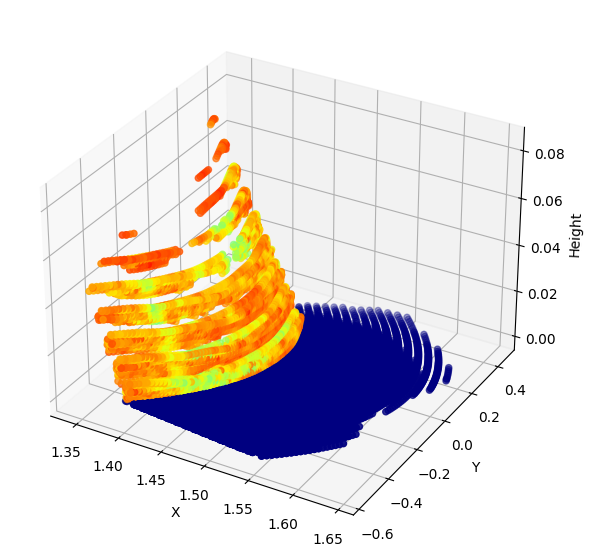

In [104]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
np_points=np.array(points)
ax.scatter(np_points[:,0],np_points[:,1],np_points[:,2], c=colors)
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Height")
plt.show()

In [28]:
np_points.shape

(3233, 3)

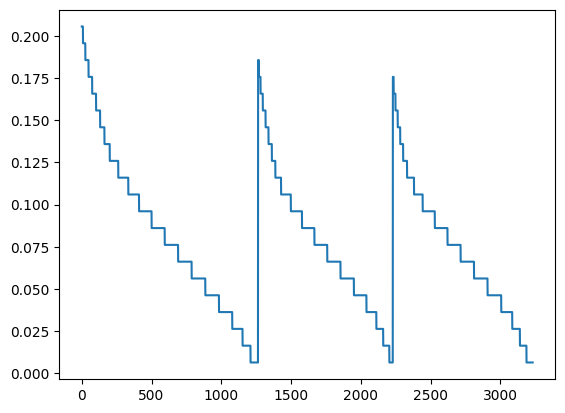

In [36]:
plt.plot(np_points[:,2])